In [2]:
    pip install -U ydata-profiling

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd

In [4]:
import pandas as pd
import sqlite3

# File path
csv_file = "/Users/skgokulkumar/Documents/work/Data/diabetes.csv"

# Load the CSV file into a Pandas DataFrame
df = pd.read_csv(csv_file)

# Connect to an SQLite database
conn = sqlite3.connect("diabetes.db")
cursor = conn.cursor()

# Drop tables if they already exist
cursor.execute("DROP TABLE IF EXISTS Patient_Data")
cursor.execute("DROP TABLE IF EXISTS Medical_Records")

# Normalize the data into separate tables
# Create a table for patient demographics
cursor.execute("""
CREATE TABLE IF NOT EXISTS Patient_Data (
    PatientID INTEGER PRIMARY KEY AUTOINCREMENT,
    Age INTEGER,
    Outcome INTEGER
)
""")

# Create a table for medical measurements
cursor.execute("""
CREATE TABLE IF NOT EXISTS Medical_Records (
    Medical_Records_ID INTEGER PRIMARY KEY AUTOINCREMENT,
    PatientID INTEGER,
    Pregnancies INTEGER,
    Glucose INTEGER,
    BloodPressure INTEGER,
    SkinThickness INTEGER,
    Insulin INTEGER,
    BMI FLOAT,
    DiabetesPedigreeFunction FLOAT,
    FOREIGN KEY (PatientID) REFERENCES Patient_Data (PatientID)
)
""")

# Insert data into the tables
for _, row in df.iterrows():
    # Insert into Patient_Data
    cursor.execute("""
    INSERT INTO Patient_Data (Age, Outcome)
    VALUES (?, ?)
    """, (row['Age'], row['Outcome']))
    patient_id = cursor.lastrowid
    
    # Insert into Medical_Records
    cursor.execute("""
    INSERT INTO Medical_Records (
        PatientID, Pregnancies, Glucose, BloodPressure,
        SkinThickness, Insulin, BMI, DiabetesPedigreeFunction
    ) VALUES (?, ?, ?, ?, ?, ?, ?, ?)
    """, (
        patient_id, row['Pregnancies'], row['Glucose'],
        row['BloodPressure'], row['SkinThickness'], row['Insulin'],
        row['BMI'], row['DiabetesPedigreeFunction']
    ))

# Commit the changes
conn.commit()

# Write an SQL query with joins to reconstruct the original data
query = """
SELECT 
    p.PatientID,
    m.Pregnancies,
    m.Glucose,
    m.BloodPressure,
    m.SkinThickness,
    m.Insulin,
    m.BMI,
    m.DiabetesPedigreeFunction,  
    p.Age,
    p.Outcome
FROM 
    Patient_Data p
JOIN 
    Medical_Records m
ON 
    p.PatientID = m.PatientID
"""

# Execute the query and load the result into a Pandas DataFrame
reconstructed_df = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Display the reconstructed DataFrame
print(reconstructed_df)


     PatientID  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin  \
0            1            6      148             72             35        0   
1            2            1       85             66             29        0   
2            3            8      183             64              0        0   
3            4            1       89             66             23       94   
4            5            0      137             40             35      168   
..         ...          ...      ...            ...            ...      ...   
763        764           10      101             76             48      180   
764        765            2      122             70             27        0   
765        766            5      121             72             23      112   
766        767            1      126             60              0        0   
767        768            1       93             70             31        0   

      BMI  DiabetesPedigreeFunction  Age  Outcome  

In [5]:
#EDA

In [6]:
import pandas as pd
import sqlite3

# Connect to the SQLite database
conn = sqlite3.connect("diabetes.db")

# Write an SQL query to fetch data from the tables
query = """
SELECT 
    p.PatientID,
    m.Pregnancies,
    m.Glucose,
    m.BloodPressure,
    m.SkinThickness,
    m.Insulin,
    m.BMI,
    m.DiabetesPedigreeFunction,
    p.Age,
    p.Outcome
FROM 
    Patient_Data p
JOIN 
    Medical_Records m
ON 
    p.PatientID = m.PatientID
"""

# Execute the query and load the result into a Pandas DataFrame
data = pd.read_sql_query(query, conn)

# Close the database connection
conn.close()

# Display the first few rows to ensure it loaded correctly
print("First 5 rows of the dataset:")
print(data.head())

# Display dataset information (column names, data types, etc.)
print("\nDataset information:")
print(data.info())


First 5 rows of the dataset:
   PatientID  Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin  \
0          1            6      148             72             35        0   
1          2            1       85             66             29        0   
2          3            8      183             64              0        0   
3          4            1       89             66             23       94   
4          5            0      137             40             35      168   

    BMI  DiabetesPedigreeFunction  Age  Outcome  
0  33.6                     0.627   50        1  
1  26.6                     0.351   31        0  
2  23.3                     0.672   32        1  
3  28.1                     0.167   21        0  
4  43.1                     2.288   33        1  

Dataset information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------               

In [7]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(data, title="Pandas Profiling Report")

In [8]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
data.describe()

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,384.500000,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,221.846794,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,192.750000,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,384.500000,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,576.250000,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,768.000000,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [12]:
data["Outcome"].value_counts()

Outcome
0    500
1    268
Name: count, dtype: int64

In [13]:
data

,PatientID,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,1,6,148,72,35,0,33.6,0.627,50,1
1,2,1,85,66,29,0,26.6,0.351,31,0
2,3,8,183,64,0,0,23.3,0.672,32,1
3,4,1,89,66,23,94,28.1,0.167,21,0
4,5,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...,...
763,764,10,101,76,48,180,32.9,0.171,63,0
764,765,2,122,70,27,0,36.8,0.340,27,0
765,766,5,121,72,23,112,26.2,0.245,30,0
766,767,1,126,60,0,0,30.1,0.349,47,1


In [14]:
# Identify numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64']).columns

# Identify categorical columns (usually objects or int64 if encoded)
categorical_columns = data.select_dtypes(include=['object']).columns

print("Numerical columns:", numerical_columns)
print("Categorical columns:", categorical_columns)


Numerical columns: Index(['PatientID', 'Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness',
       'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')
Categorical columns: Index([], dtype='object')


In [20]:
# Check for missing values
missing_values = data.isnull().sum()

# Display the missing values count
print("Missing values in each column:")
print(missing_values)


Missing values in each column:
PatientID                   0
Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


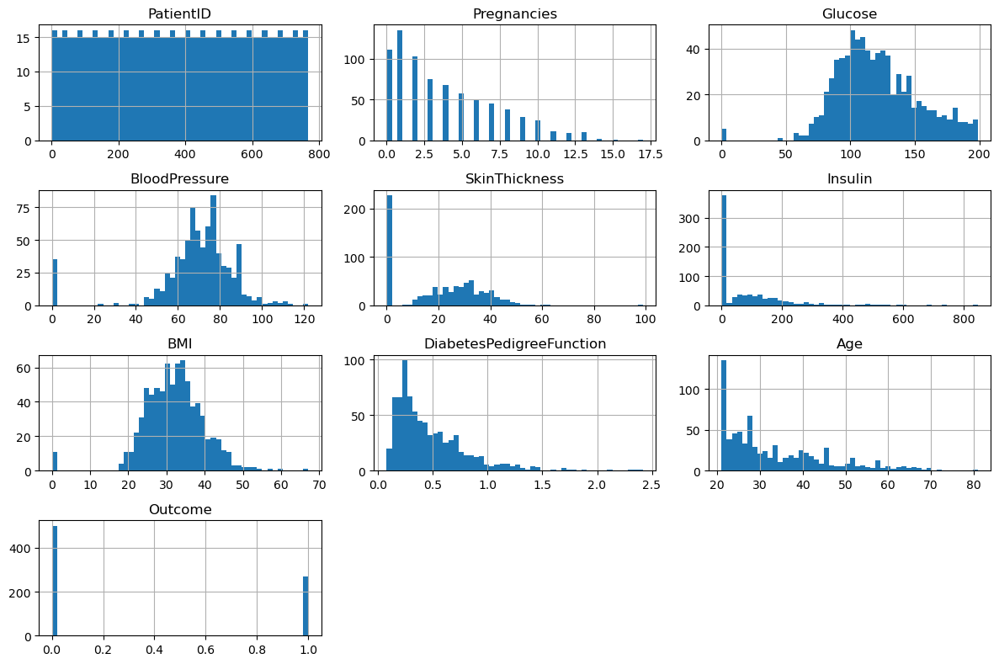

In [411]:
import matplotlib.pyplot as plt

data.hist(bins=50, figsize=(12, 8))
plt.tight_layout()

# Display the plot
plt.show()

In [23]:
#Analysis:
#Numerical Columns: All columns are numerical, including PatientID, Pregnancies, Glucose, BloodPressure, SkinThickness, Insulin, BMI, 
#DiabetesPedigreeFunction, Age, and Outcome.
#The Outcome column is technically numerical (0 or 1), but it should be treated as categorical since it represents a classification label.
#Categorical Columns: This dataset has no explicitly categorical columns, but we can treat Outcome as categorical because it represents the
#target class in classification.
#The dataset has missing values in columns like glucose(small),bloodpressure,skinthickness,insulin(large) as they cannot be 0 as its unrealistic
#A few outliers with very high pregnancy counts.

In [24]:
#Spliting dataset and cleaning

In [25]:
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Connect to SQLite database and fetch the data
conn = sqlite3.connect("diabetes.db")
query = """
SELECT 
    p.PatientID,
    m.Pregnancies,
    m.Glucose,
    m.BloodPressure,
    m.SkinThickness,
    m.Insulin,
    m.BMI,
    m.DiabetesPedigreeFunction,
    p.Age,
    p.Outcome
FROM 
    Patient_Data p
JOIN 
    Medical_Records m
ON 
    p.PatientID = m.PatientID
"""
data = pd.read_sql_query(query, conn)
conn.close()

# Inspect class distribution
outcome_counts = data['Outcome'].value_counts()
print("Outcome distribution:")
print(outcome_counts)



# Perform stratified train/test split
X = data.drop(columns=['Outcome', 'PatientID'])
y = data['Outcome']

#Splitting the dataset
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Display the stratified distribution
print("\nTrain set class distribution:")
print(y_train.value_counts())

print("\nTest set class distribution:")
print(y_test.value_counts())


Outcome distribution:
Outcome
0    500
1    268
Name: count, dtype: int64

Train set class distribution:
Outcome
0    400
1    214
Name: count, dtype: int64

Test set class distribution:
Outcome
0    100
1     54
Name: count, dtype: int64


/var/folders/b7/cdcz4hy13nsbgx98gqslmhnm0000gn/T/ipykernel_27048/2808955015.py:40: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


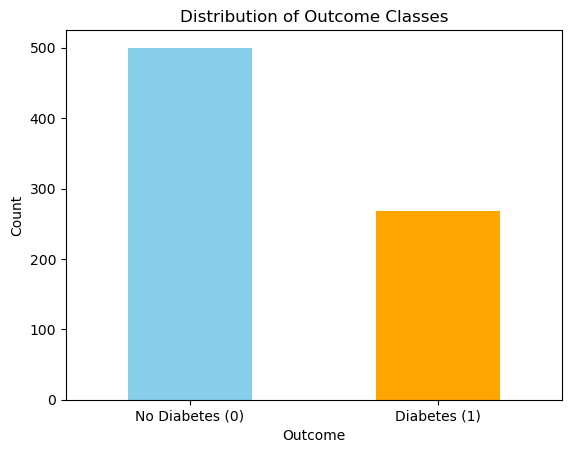

In [413]:
# Visualize the distribution
outcome_counts.plot(kind='bar', color=['skyblue', 'orange'])
plt.title("Distribution of Outcome Classes")
plt.xlabel("Outcome")
plt.ylabel("Count")
plt.xticks([0, 1], ["No Diabetes (0)", "Diabetes (1)"], rotation=0)
plt.show()

In [26]:
# Combine X_train and y_train into a single DataFrame
train_set = pd.concat([X_train, y_train], axis=1)

# Display the first few rows to verify
print("Training set:")
print(train_set.head())
# Combine X_test and y_test into a single DataFrame
test_set = pd.concat([X_test, y_test], axis=1)

# Display the first few rows to verify
print("Testing set:")
print(test_set.head())
# Display the class distribution in the training and test sets for the 'Outcome' column
print("\nTrain set class distribution (Outcome):")
print(train_set['Outcome'].value_counts() / len(train_set))

print("\nTest set class distribution (Outcome):")
print(test_set['Outcome'].value_counts() / len(test_set))


Training set:
     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
353            1       90             62             12       43  27.2   
711            5      126             78             27       22  29.6   
373            2      105             58             40       94  34.9   
46             1      146             56              0        0  29.7   
682            0       95             64             39      105  44.6   

     DiabetesPedigreeFunction  Age  Outcome  
353                     0.580   24        0  
711                     0.439   40        0  
373                     0.225   25        0  
46                      0.564   29        0  
682                     0.366   22        0  
Testing set:
     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
44             7      159             64              0        0  27.4   
672           10       68            106             23       49  35.5   
700            2      122     

In [27]:
# Define new column names
new_column_names = {
    'Pregnancies': 'Number_of_Pregnancies',
    'Glucose': 'Glucose_Concentration',
    'BloodPressure': 'Blood_Pressure',
    'SkinThickness': 'Skin_Thickness',
    'Insulin': 'Insulin_Level',
    'BMI': 'Body_Mass_Index',
    'DiabetesPedigreeFunction': 'Diabetes_Pedigree_Function',
    'Age': 'Age_In_Years',
    'Outcome': 'Diabetes_Outcome'
}

# Rename columns in train_set
train_set = train_set.rename(columns=new_column_names)
# Rename columns in test_set (must use the same new_column_names dictionary)
test_set = test_set.rename(columns=new_column_names)


In [28]:
# Rename the index of train_set and X_test (if needed)
train_set = train_set.rename_axis('Patient_ID')
test_set = test_set.rename_axis('Patient_ID')



In [29]:
# Remove rows that are completely empty (all NaNs) from train_set
train_set = train_set.dropna(how='all')

# Alternatively, remove rows where all columns contain empty strings (if applicable)
train_set = train_set[~(train_set.apply(lambda row: row.astype(str).str.strip().eq('').all(), axis=1))]

# Verify the change by printing the shape (rows, columns)
print("Shape of cleaned training data:", train_set.shape)

# Count NaN values in each column before cleaning in train_set
before_cleaning_train_set = train_set.isnull().sum()

# Display the result (number of NaNs in each column before cleaning)
print("\nNaN values in each column of training data before cleaning:")
print(before_cleaning_train_set)


Shape of cleaned training data: (614, 9)

NaN values in each column of training data before cleaning:
Number_of_Pregnancies         0
Glucose_Concentration         0
Blood_Pressure                0
Skin_Thickness                0
Insulin_Level                 0
Body_Mass_Index               0
Diabetes_Pedigree_Function    0
Age_In_Years                  0
Diabetes_Outcome              0
dtype: int64


In [30]:
train_set = train_set.apply(lambda x: x.str.lower() if x.dtype == "object" else x)


In [31]:
# Remove leading/trailing whitespace from all string columns in train_set
train_set = train_set.apply(lambda x: x.str.strip() if x.dtype == "object" else x)

# Verify the changes by displaying the first few rows of train_set
print(train_set.head())



            Number_of_Pregnancies  Glucose_Concentration  Blood_Pressure  \
Patient_ID                                                                 
353                             1                     90              62   
711                             5                    126              78   
373                             2                    105              58   
46                              1                    146              56   
682                             0                     95              64   

            Skin_Thickness  Insulin_Level  Body_Mass_Index  \
Patient_ID                                                   
353                     12             43             27.2   
711                     27             22             29.6   
373                     40             94             34.9   
46                       0              0             29.7   
682                     39            105             44.6   

            Diabetes_Pedigree_Fu

In [32]:
# Convert specific columns to float in train_set if necessary
train_set['Glucose_Concentration'] = train_set['Glucose_Concentration'].astype(float)
train_set['Skin_Thickness'] = train_set['Skin_Thickness'].astype(float)

# Verify the changes by displaying the data types of the columns in train_set
print(train_set.dtypes)


Number_of_Pregnancies           int64
Glucose_Concentration         float64
Blood_Pressure                  int64
Skin_Thickness                float64
Insulin_Level                   int64
Body_Mass_Index               float64
Diabetes_Pedigree_Function    float64
Age_In_Years                    int64
Diabetes_Outcome                int64
dtype: object


In [33]:
# Calculate the IQR for each numeric column in train_set
Q1 = train_set.quantile(0.25)
Q3 = train_set.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers (values outside of the acceptable range)
outliers = (train_set < (Q1 - 1.5 * IQR)) | (train_set > (Q3 + 1.5 * IQR))

# Count the number of outliers in each column
outliers_count = outliers.sum()

# Display the count of outliers per column
print("Outliers count per column in train_set:")
print(outliers_count)

# Remove rows containing outliers in any column from X_train
train_set = train_set[~outliers.any(axis=1)]

# Verify the changes (shape of the data after removing outliers)
print("Shape of X_train after removing outliers:", train_set.shape)


Outliers count per column in train_set:
Number_of_Pregnancies          2
Glucose_Concentration          4
Blood_Pressure                33
Skin_Thickness                 1
Insulin_Level                 21
Body_Mass_Index               15
Diabetes_Pedigree_Function    19
Age_In_Years                   6
Diabetes_Outcome               0
dtype: int64
Shape of X_train after removing outliers: (526, 9)


In [52]:
import seaborn as sns
# Select only numerical columns
numerical_columns = train_set.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()

# Display the correlation matrix
print(correlation_matrix)



                            Number_of_Pregnancies  Glucose_Concentration  \
Number_of_Pregnancies                    1.000000               0.135255   
Glucose_Concentration                    0.135255               1.000000   
Blood_Pressure                           0.203946               0.231621   
Skin_Thickness                          -0.117203              -0.000493   
Insulin_Level                           -0.083021               0.289618   
Body_Mass_Index                          0.015724               0.202451   
Diabetes_Pedigree_Function              -0.003608               0.076185   
Age_In_Years                             0.560591               0.297438   
Diabetes_Outcome                         0.214362               0.516349   

                            Blood_Pressure  Skin_Thickness  Insulin_Level  \
Number_of_Pregnancies             0.203946       -0.117203      -0.083021   
Glucose_Concentration             0.231621       -0.000493       0.289618   
Blood_Pr

/var/folders/b7/cdcz4hy13nsbgx98gqslmhnm0000gn/T/ipykernel_27048/2585989239.py:14: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


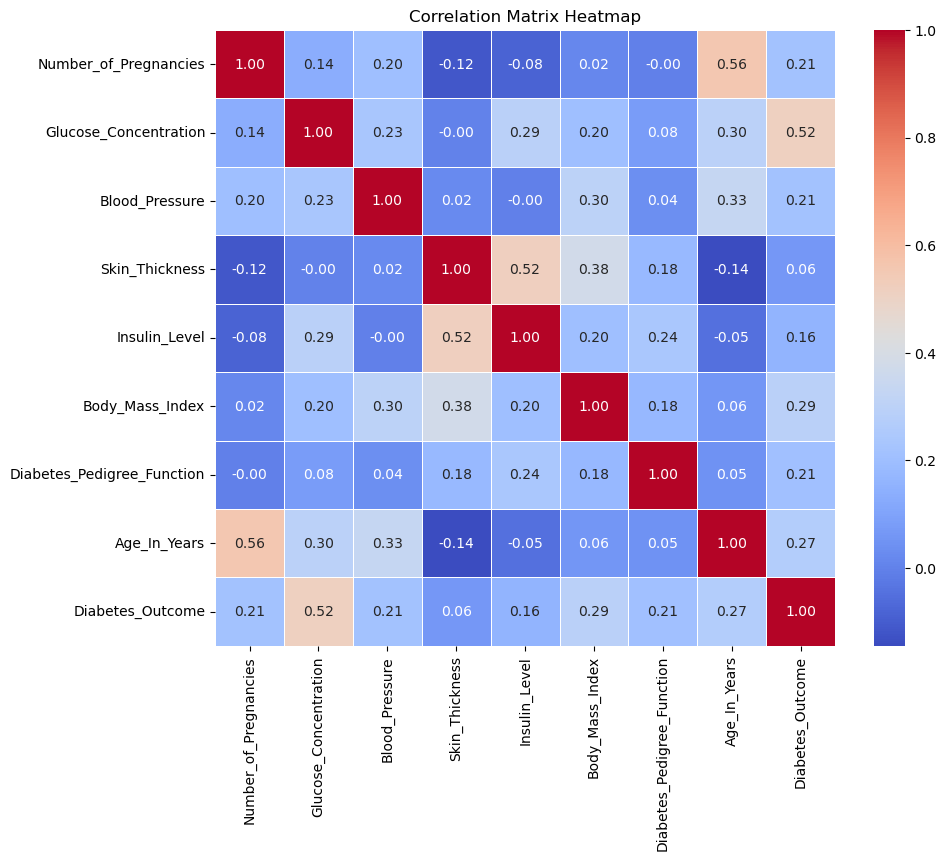

In [415]:
plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

In [54]:
# Data Preprocessing -- fix missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

train_set_num = train_set.select_dtypes(include=[np.number])
imputer.fit(train_set_num)
train_set_num.describe()
pd.DataFrame(imputer.transform(train_set_num), columns=train_set_num.columns).describe()


,Number_of_Pregnancies,Glucose_Concentration,Blood_Pressure,Skin_Thickness,Insulin_Level,Body_Mass_Index,Diabetes_Pedigree_Function,Age_In_Years,Diabetes_Outcome
count,526.000000,526.000000,526.000000,526.000000,526.000000,526.000000,526.000000,526.000000,526.000000
mean,3.766160,119.382129,71.773764,20.665399,68.370722,31.959316,0.441804,32.865019,0.319392
std,3.223201,29.181801,11.280837,15.187659,80.373328,6.407913,0.260789,11.233574,0.466685
min,0.000000,56.000000,38.000000,0.000000,0.000000,18.200000,0.084000,21.000000,0.000000
25%,1.000000,99.000000,64.000000,0.000000,0.000000,27.400000,0.246250,24.000000,0.000000
50%,3.000000,114.000000,72.000000,23.000000,44.000000,32.000000,0.375500,29.000000,0.000000
75%,6.000000,136.750000,80.000000,32.000000,125.000000,35.900000,0.596500,40.000000,1.000000
max,13.000000,198.000000,106.000000,60.000000,325.000000,50.000000,1.224000,66.000000,1.000000


In [56]:
# Data Preprocessing -- Handle text attributes
from sklearn.preprocessing import OneHotEncoder

### one hot encoder can handle unknown values by ignoring them! Look up documentation

train_set_cat = train_set.select_dtypes(include=['object']) # PandasV2
print(train_set_cat)
cat_encoder = OneHotEncoder()
train_set_cat_1hot = cat_encoder.fit_transform(train_set_cat)
train_set_cat_1hot.toarray()
cat_encoder.categories_

Empty DataFrame
Columns: []
Index: [353, 711, 373, 46, 682, 360, 414, 339, 694, 33, 218, 705, 76, 616, 675, 613, 34, 405, 464, 576, 664, 466, 267, 167, 320, 610, 485, 295, 204, 195, 434, 217, 323, 85, 26, 171, 716, 96, 561, 175, 737, 294, 209, 730, 764, 751, 216, 386, 467, 696, 652, 224, 676, 416, 669, 148, 404, 206, 709, 61, 132, 40, 752, 375, 214, 69, 14, 306, 312, 334, 442, 658, 105, 551, 299, 744, 282, 316, 141, 463, 657, 718, 544, 321, 358, 117, 651, 118, 603, 473, 51, 729, 623, 671, 234, 465, 100, 134, 569, 103, ...]

[526 rows x 0 columns]


[]

In [58]:
#The train_set_cat dataframe is empty, meaning there are no categorical data

In [60]:
# Data Preprocessing -- Feature Scaling 
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
train_set_num_min_max_scaled = min_max_scaler.fit_transform(train_set)

from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
train_set_std_scaled = std_scaler.fit_transform(train_set)


In [62]:
#There are no categorical features in your dataset based on your previous analysis, so we don’t need to apply one-hot encoding

In [64]:
# Data Preprocessing -- Custom Transformers

from sklearn.preprocessing import FunctionTransformer
log_transformer = FunctionTransformer(np.log, inverse_func=np.exp) # inverse_func option 
log_transformer.transform(train_set[["Glucose_Concentration"]])

,Glucose_Concentration
Patient_ID,
353,4.499810
711,4.836282
373,4.653960
46,4.983607
682,4.553877
...,...
451,4.897840
113,4.330733
556,4.574711


In [66]:
pip install imbalanced-learn


Note: you may need to restart the kernel to use updated packages.


In [68]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted

class StandardScalerClone(BaseEstimator, TransformerMixin):
    def __init__(self, with_mean=True):  # no *args or **kwargs!
        self.with_mean = with_mean

    def fit(self, X, y=None):  # y is required even though we don't use it
        X = check_array(X)  # checks that X is an array with finite float values
        self.mean_ = X.mean(axis=0)
        self.scale_ = X.std(axis=0)
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()
        return self  # always return self!

    def transform(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)
        assert self.n_features_in_ == X.shape[1]
        if self.with_mean:
            X = X - self.mean_
        return X / self.scale_

In [70]:
from sklearn.cluster import KMeans

class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)
    
    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

In [72]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans

# Define the ClusterSimilarity class
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10, random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def fit_transform(self, X, y=None, sample_weight=None):
        self.fit(X, y, sample_weight)
        return self.transform(X)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

# Generate some sample data
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=42)

# Instantiate the ClusterSimilarity transformer
cluster_sim = ClusterSimilarity(n_clusters=3, gamma=0.5, random_state=42)

# Fit and transform the data
similarity_matrix = cluster_sim.fit_transform(X)



In [74]:
import matplotlib.pyplot as plt
import pandas as pd

# Instantiate the ClusterSimilarity transformer
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1.0, random_state=42)

# Select features for clustering
selected_features = ["Glucose_Concentration", "Body_Mass_Index", "Blood_Pressure", "Age_In_Years", "Diabetes_Pedigree_Function"]


# Fit and transform the selected features
similarities = cluster_simil.fit_transform(train_set[selected_features])

# Add cluster similarities to the dataset
train_set_renamed = train_set.rename(columns={
    "Glucose_Concentration": "Glucose Concentration",
    "Blood_Pressure": "Blood Pressure",
    "Body_Mass_Index": "Body Mass Index",
    "Diabetes_Outcome": "Diabetes Outcome"
})
train_set_renamed["Max cluster similarity"] = similarities.max(axis=1)






/var/folders/b7/cdcz4hy13nsbgx98gqslmhnm0000gn/T/ipykernel_27048/3560035475.py:39: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


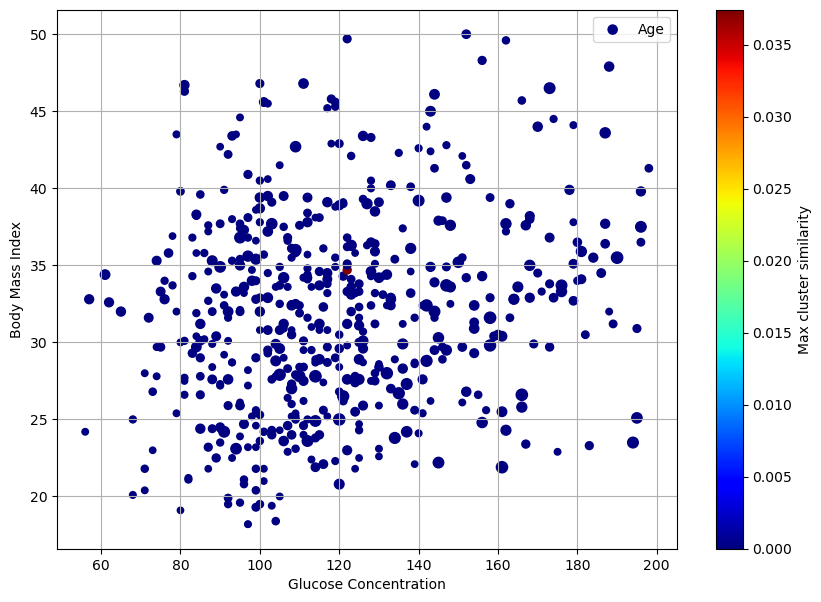

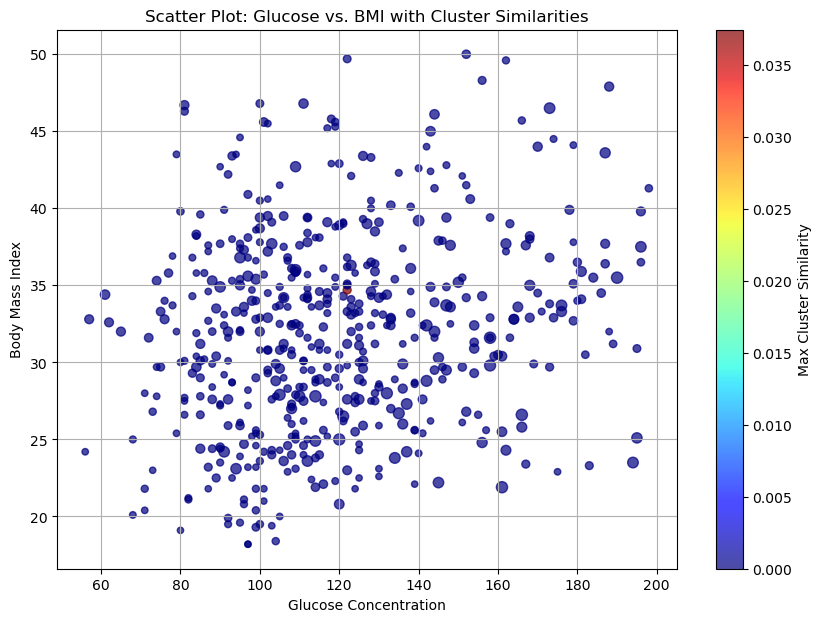

In [425]:
import matplotlib.pyplot as plt

# Scatter plot using matplotlib
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    train_set_renamed["Glucose Concentration"],
    train_set_renamed["Body Mass Index"],
    c=train_set_renamed["Max cluster similarity"],
    s=train_set_renamed["Age_In_Years"],  # Marker size
    cmap="jet",
    alpha=0.7  # Optional transparency
)

# Add labels, title, and colorbar
plt.xlabel("Glucose Concentration")
plt.ylabel("Body Mass Index")
plt.title("Scatter Plot: Glucose vs. BMI with Cluster Similarities")
plt.colorbar(scatter, label="Max Cluster Similarity")
plt.grid(True)  # Add gridlines
plt.show()


            Number_of_Pregnancies  Glucose Concentration  Blood Pressure  \
Patient_ID                                                                 
353                             1                   90.0              62   
711                             5                  126.0              78   
373                             2                  105.0              58   
46                              1                  146.0              56   
682                             0                   95.0              64   

            Skin_Thickness  Insulin_Level  Body Mass Index  \
Patient_ID                                                   
353                   12.0             43             27.2   
711                   27.0             22             29.6   
373                   40.0             94             34.9   
46                     0.0              0             29.7   
682                   39.0            105             44.6   

            Diabetes_Pedigree_Fu

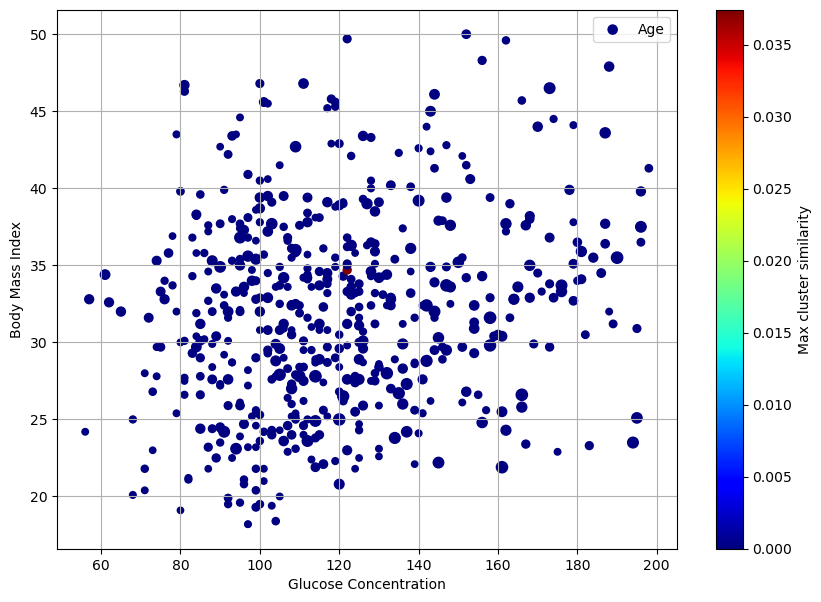

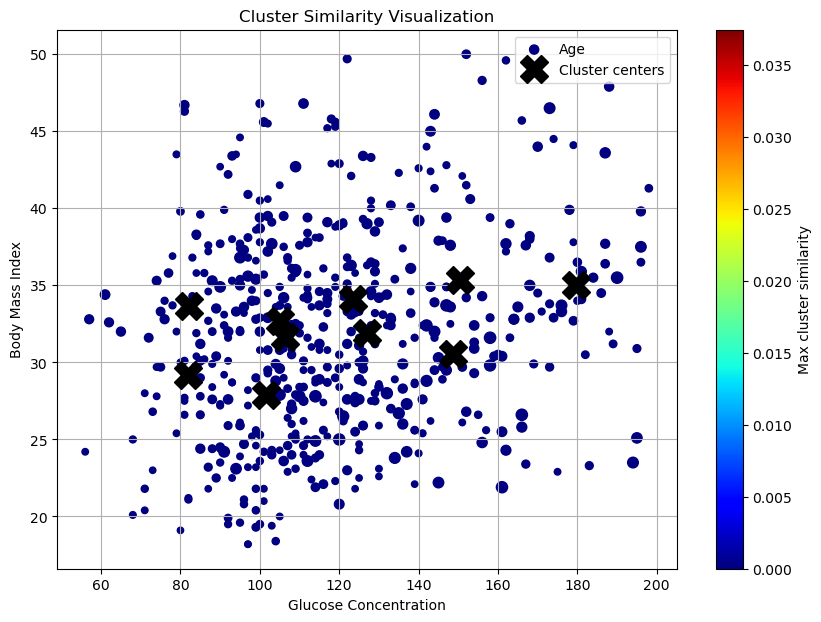

In [421]:


# Plot cluster centers
plt.plot(cluster_simil.kmeans_.cluster_centers_[:, 0],  # First feature
         cluster_simil.kmeans_.cluster_centers_[:, 1],  # Second feature
         linestyle="", color="black", marker="X", markersize=20,
         label="Cluster centers")

plt.legend(loc="upper right")
plt.title("Cluster Similarity Visualization")
plt.xlabel("Glucose Concentration")
plt.ylabel("Body Mass Index")
plt.show()

In [76]:
# Pipeline
from sklearn.pipeline import Pipeline, make_pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

num_pipeline
num_pipeline.named_steps
num_pipeline.fit_transform(train_set_num)
x = pd.DataFrame(num_pipeline.fit_transform(train_set_num), columns=num_pipeline.get_feature_names_out())
x["Glucose_Concentration"].s()

-2.174042120642062

In [78]:
from sklearn.compose import make_column_selector, make_column_transformer


num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"), 
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)



In [80]:
train_set_prepared = preprocessing.fit_transform(train_set)
train_set_prepared_fr = pd.DataFrame(
    train_set_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=train_set.index)
train_set_prepared_fr.head(2)

,pipeline-1__Number_of_Pregnancies,pipeline-1__Glucose_Concentration,pipeline-1__Blood_Pressure,pipeline-1__Skin_Thickness,pipeline-1__Insulin_Level,pipeline-1__Body_Mass_Index,pipeline-1__Diabetes_Pedigree_Function,pipeline-1__Age_In_Years,pipeline-1__Diabetes_Outcome
Patient_ID,,,,,,,,,
353,-0.859020,-1.007823,-0.867229,-0.571098,-0.315961,-0.743432,0.530419,-0.789905,-0.685036
711,0.383164,0.226997,0.552456,0.417486,-0.577491,-0.368538,-0.010763,0.635753,-0.685036


In [82]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
import numpy as np

# Step 1: Define the preprocessing steps for numerical and categorical features

# Numeric features pipeline with StandardScaler, MinMaxScaler, and LogTransformation
num_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),         # Handle missing values
    ('log', FunctionTransformer(np.log1p, validate=True)), # Apply log transformation
    ('scaler', StandardScaler()),                          # Apply standard scaling
    ('minmax', MinMaxScaler(feature_range=(-1, 1)))        # Apply Min-Max Scaling
])

# Categorical features pipeline with OneHotEncoder
cat_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Handle missing categorical values
  #  ('onehot', OneHotEncoder(handle_unknown='ignore'))     # One-hot encode categorical features
])

# Step 2: Combine both pipelines using ColumnTransformer
preprocessing = ColumnTransformer([
    ('num', num_pipeline, ['Number_of_Pregnancies', 'Glucose_Concentration', 'Blood_Pressure', 'Skin_Thickness', 
                           'Insulin_Level', 'Body_Mass_Index', 'Diabetes_Pedigree_Function', 'Age_In_Years']),  # Numeric columns
  #  ('cat', cat_pipeline, ['Diabetes_Outcome'])  # Categorical columns (if any)
])

# Step 3: Combine preprocessing with Logistic Regression in a pipeline
model_pipeline = Pipeline([
    ('preprocessing', preprocessing),
    ('log_reg', LogisticRegression(max_iter=1000))
])

# Step 4: Train the model with the already split data (X_train, y_train)
X_train = train_set.drop('Diabetes_Outcome', axis=1)  # Drop the target column
y_train = train_set['Diabetes_Outcome']
model_pipeline.fit(X_train, y_train)




Pipeline(steps=[('preprocessing',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('log',
                                                                   FunctionTransformer(func=<ufunc 'log1p'>,
                                                                                       validate=True)),
                                                                  ('scaler',
                                                                   StandardScaler()),
                                                                  ('minmax',
                                                                   MinMaxScaler(feature_range=(-1,
                                                                                               1)))]),
                                                  ['Number_of_Pregnancies',
                                                   'Glucose_Concentration',
                                                   'Blood_Pressure',
                                                   'Skin_Thickness',
                                                   'Insulin_Level',
                                                   'Body_Mass_Index',
                                                   'Diabetes_Pedigree_Function',
                                                   'Age_In_Years'])])),
                ('log_reg', LogisticRegression(max_iter=1000))])

In [86]:
# Ensure correct splitting for target variable
y_train = train_set['Diabetes_Outcome']
y_test = test_set['Diabetes_Outcome']
X_test = test_set.drop('Diabetes_Outcome', axis=1)    # Features (8 columns)
y_test = test_set['Diabetes_Outcome']   

In [88]:
# Evaluate the model on training and test data
train_score = model_pipeline.score(X_train, y_train)  # Accuracy on training data
test_score = model_pipeline.score(X_test, y_test)    # Accuracy on test data

print(f'Training accuracy: {train_score}')
print(f'Test accuracy: {test_score}')


Training accuracy: 0.7965779467680608
Test accuracy: 0.7077922077922078


In [90]:
from sklearn.metrics import confusion_matrix, f1_score

# Make predictions on the test set
y_pred = model_pipeline.predict(X_test)

# Calculate the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Extract TP, TN, FP, FN
TN, FP, FN, TP = cm.ravel()

# Calculate F1-score
f1 = f1_score(y_test, y_pred)

# Print the results
print(f'Confusion Matrix:\n{cm}')
print(f'True Negative (TN): {TN}')
print(f'False Positive (FP): {FP}')
print(f'False Negative (FN): {FN}')
print(f'True Positive (TP): {TP}')
print(f'F1-Score: {f1}')


Confusion Matrix:
[[83 17]
 [28 26]]
True Negative (TN): 83
False Positive (FP): 17
False Negative (FN): 28
True Positive (TP): 26
F1-Score: 0.5360824742268041


In [194]:
# Cross-validation with cross_val_score
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
import numpy as np

X_train = train_set.drop('Diabetes_Outcome', axis=1)  # Drop the target column
y_train = train_set['Diabetes_Outcome']
model = LogisticRegression()

# Define the cross-validation strategy (3-fold)
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Perform cross-validation
cv_results = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')

# Calculate mean and std of CV results
mean_score = np.mean(cv_results)
std_score = np.std(cv_results)

print(f"Mean CV Accuracy: {mean_score}")
print(f"Standard Deviation of CV Accuracy: {std_score}")


Mean CV Accuracy: 0.7794588744588745
Standard Deviation of CV Accuracy: 0.005700577154918343


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

In [196]:
#Hyperparameter Tuning with GridSearchCV
from sklearn.model_selection import GridSearchCV

# Define the model and hyperparameter grid
model = LogisticRegression()
param_grid = {
    'C': [0.1, 1, 10],  # Regularization strength
    'solver': ['liblinear', 'saga']  # Optimization algorithm
}

# Set up GridSearchCV with 3-fold cross-validation
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', verbose=1)

# Fit the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

print(f"Best Hyperparameters: {best_params}")

# Evaluate on the whole training data
train_score = best_model.score(X_train, y_train)
print(f"Training accuracy with best model: {train_score}")


Fitting 3 folds for each of 6 candidates, totalling 18 fits
Best Hyperparameters: {'C': 10, 'solver': 'liblinear'}
Training accuracy with best model: 0.8041825095057035


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max

In [96]:
!pip install dagshub mlflow




[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [131]:

pip install dagshub


  Using cached dagshub-0.4.0-py3-none-any.whl.metadata (11 kB)
  Using cached dacite-1.6.0-py3-none-any.whl.metadata (14 kB)
  Using cached gql-3.5.0-py2.py3-none-any.whl.metadata (9.2 kB)
  Using cached dataclasses_json-0.6.7-py3-none-any.whl.metadata (25 kB)
  Using cached treelib-1.7.0-py3-none-any.whl.metadata (1.3 kB)
  Using cached pathvalidate-3.2.1-py3-none-any.whl.metadata (12 kB)
  Using cached boto3-1.35.84-py3-none-any.whl.metadata (6.7 kB)
  Using cached dagshub_annotation_converter-0.1.2-py3-none-any.whl.metadata (2.5 kB)
  Using cached botocore-1.35.84-py3-none-any.whl.metadata (5.7 kB)
  Using cached s3transfer-0.10.4-py3-none-any.whl.metadata (1.7 kB)
  Using cached marshmallow-3.23.2-py3-none-any.whl.metadata (7.1 kB)
  Using cached typing_inspect-0.9.0-py3-none-any.whl.metadata (1.5 kB)
  Using cached backoff-2.2.1-py3-none-any.whl.metadata (14 kB)
Using cached dagshub-0.4.0-py3-none-any.whl (254 kB)
Using cached dacite-1.6.0-py3-none-any.whl (12 kB)
Using cached dag

In [137]:
import dagshub
dagshub.init(repo_owner='Gopikaskumar18', repo_name='Fall_2024_Diabetes_Model', mlflow=True)

Initialized MLflow to track repo "Gopikaskumar18/Fall_2024_Diabetes_Model"

Repository Gopikaskumar18/Fall_2024_Diabetes_Model initialized!

In [351]:
import os
import mlflow
from sklearn.metrics import confusion_matrix, f1_score
from mlflow.models.signature import infer_signature
from sklearn.pipeline import Pipeline
import dagshub

dagshub.init(repo_owner='gopikaskumar18',
             repo_name='Fall_2024_Diabetes_Model',
             mlflow=True)

# Set up MLFlow URI and credentials
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'

# Assuming `y_test` and `y_pred` are already defined
with mlflow.start_run():
    cm = confusion_matrix(y_test, y_pred)
    tn, fp, fn, tp = cm.ravel()[:4]
    mlflow.log_metric("True Negatives", tn)
    mlflow.log_metric("False Positives", fp)
    mlflow.log_metric("False Negatives", fn)
    mlflow.log_metric("True Positives", tp)

    # Log F1 score
    f1 = f1_score(y_test, y_pred)
    mlflow.log_metric("F1_Score", f1)
    print(f"Logged F1 Score: {f1}")

    # Log hyperparameters
    mlflow.log_param("Model_Type", "Logistic Regression")
    mlflow.log_param("Scaler", "StandardScaler + MinMaxScaler")
    print("Logged hyperparameters: Model_Type, Scaler")

    # Log the model with signature
    signature = infer_signature(X_train, model_pipeline.predict(X_train))
    mlflow.sklearn.log_model(model_pipeline, "model_with_signature", signature=signature)
    print("Logged model with signature.")

print("All metrics, parameters, and model logged successfully.")


Initialized MLflow to track repo "gopikaskumar18/Fall_2024_Diabetes_Model"

Repository gopikaskumar18/Fall_2024_Diabetes_Model initialized!

Logged F1 Score: 0.5360824742268041
Logged hyperparameters: Model_Type, Scaler


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(


Logged model with signature.
🏃 View run wise-lark-683 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/1a79238de9bd4981bdff129a80094bff
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
All metrics, parameters, and model logged successfully.


In [169]:
MLFLOW_TRACKING_URI = "https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)


In [153]:
pip install dagshub mlflow

Note: you may need to restart the kernel to use updated packages.


In [206]:
import os
import mlflow
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import accuracy_score
import numpy as np
from mlflow.models.signature import infer_signature

# Set up DagsHub MLFlow Tracking URI
MLFLOW_TRACKING_URI = "https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'Gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'

# Set the MLFlow Tracking URI
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Prepare your data (assuming train_set is already defined)
X_train = train_set.drop('Diabetes_Outcome', axis=1)  # Drop the target column
y_train = train_set['Diabetes_Outcome']

# Initialize Logistic Regression model
model = LogisticRegression()

# Cross-validation with 3-fold
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
cv_results = cross_val_score(model, X_train, y_train, cv=cv, scoring='accuracy')

# Calculate mean and std of CV results
mean_score = np.mean(cv_results)
std_score = np.std(cv_results)

# Log cross-validation results to DagsHub
with mlflow.start_run():
    mlflow.log_metric("Mean_CV_Accuracy", mean_score)
    mlflow.log_metric("Std_CV_Accuracy", std_score)
    print(f"Mean CV Accuracy: {mean_score}")
    print(f"Standard Deviation of CV Accuracy: {std_score}")
    
    # Log the initial Logistic Regression model (before hyperparameter tuning)
    signature = infer_signature(X_train, model.fit(X_train, y_train).predict(X_train))
  #  mlflow.sklearn.log_model(model, "logistic_regression_model", signature=signature)
    model_info = mlflow.sklearn.log_model(
          sk_model=model,
          artifact_path="Diabetes_Prediction_Outcome",
          signature=signature,
          input_example=X_train,
          registered_model_name="logistic_regression_model",
      )

# Hyperparameter Tuning with GridSearchCV
param_grid = {
    'C': [0.1, 1, 10],  # Regularization strength
    'solver': ['liblinear', 'saga']  # Optimization algorithm
}

# Set up GridSearchCV with 3-fold cross-validation
grid_search = GridSearchCV(model, param_grid, cv=3, scoring='accuracy', verbose=1)
grid_search.fit(X_train, y_train)

# Get the best parameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Log the best hyperparameters and model to DagsHub
with mlflow.start_run():
    mlflow.log_param("Best_Hyperparameters", best_params)
    print(f"Best Hyperparameters: {best_params}")
    
    # Log the best Logistic Regression model (after hyperparameter tuning)
    signature = infer_signature(X_train, best_model.predict(X_train))
  #  mlflow.sklearn.log_model(best_model, "logistic_regression_model_after_hyperparameter_tuning", signature=signature)
    model_info = mlflow.sklearn.log_model(
          sk_model=best_model,
          artifact_path="Diabetes_Prediction_Outcome",
          signature=signature,
          input_example=X_train,
          registered_model_name="logistic_regression_model_after_hyperparameter_tuning",
      )
    
    # Evaluate the best model on the whole training data
    train_score = best_model.score(X_train, y_train)
    print(f"Training accuracy with best model: {train_score}")
    mlflow.log_metric("Training_Accuracy", train_score)

    # Log the best model
    print("Logged best Logistic Regression model.")


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

Mean CV Accuracy: 0.7794588744588745
Standard Deviation of CV Accuracy: 0.005700577154918343


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternativel

🏃 View run omniscient-fly-244 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/93e9f8c1c7d745729a11f7620a20840f
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Fitting 3 folds for each of 6 candidates, totalling 18 fits


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:349: ConvergenceWarning: The max

Best Hyperparameters: {'C': 10, 'solver': 'liblinear'}


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Successfully registered model 'logistic_regression_model_after_hyperparameter_tuning'.
2024/12/19 16:36:16 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: logistic_reg

Training accuracy with best model: 0.8041825095057035
Logged best Logistic Regression model.
🏃 View run indecisive-gnat-570 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/289f61e9bb0d49d79c53872e2920801f
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0


In [ ]:
#Experiment2

In [210]:
pip install xgboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.6 MB/s eta 0:00:00 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [214]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.metrics import f1_score, confusion_matrix
from mlflow.models.signature import infer_signature

# Set the MLFlow tracking URI for DagsHub
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'

# Define your preprocessing pipeline
numerical_features = X_train.select_dtypes(include=['float64', 'int64']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

# Preprocessing for numerical data
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values
    ('scaler', StandardScaler())  # Standardize features
])

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine both into a column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

# Define a function to log the results for each model
def log_model_results(model, X_train, y_train, X_test, y_test, model_name):
    with mlflow.start_run():
        # Fit the model
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Calculate F1 Score
        f1 = f1_score(y_test, y_pred)
        
        # Get confusion matrix values
        cm = confusion_matrix(y_test, y_pred)
        tn, fp, fn, tp = cm.ravel()[:4]
        
        # Log confusion matrix values as metrics
        mlflow.log_metric("True Negatives", tn)
        mlflow.log_metric("False Positives", fp)
        mlflow.log_metric("False Negatives", fn)
        mlflow.log_metric("True Positives", tp)
        
        # Log F1 score
        mlflow.log_metric("F1_Score", f1)
        
        # Log the model with signature
        signature = infer_signature(X_train, model.predict(X_train))
        model_info = mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_model",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_model",
        )
        
        print(f"Model {model_name} logged with F1 Score: {f1}")
        print(f"Confusion Matrix: TP={tp}, TN={tn}, FP={fp}, FN={fn}")

# Define the classifiers to be used
models = [
    ("LogisticRegression", LogisticRegression(max_iter=1000)),
    ("RidgeClassifier", RidgeClassifier()),
    ("RandomForestClassifier", RandomForestClassifier(n_estimators=100)),
    ("XGBClassifier", XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
]

# Set up cross-validation strategy (3-fold or 10-fold)
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Loop over models and log results
for model_name, model in models:
    print(f"Training and logging {model_name}...")
    
    # Create pipeline with preprocessing and classifier
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Evaluate using cross-validation
    cv_results = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='accuracy')
    
    # Calculate mean and std of CV results
    mean_score = np.mean(cv_results)
    std_score = np.std(cv_results)
    
    # Log CV results to MLFlow
    print(f"Mean CV Accuracy: {mean_score}")
    print(f"Standard Deviation of CV Accuracy: {std_score}")
    
    # Log the model results on the test set
    log_model_results(pipeline, X_train, y_train, X_test, y_test, model_name)
    
    print(f"Completed logging for {model_name}\n")


Training and logging LogisticRegression...
Mean CV Accuracy: 0.7832900432900433
Standard Deviation of CV Accuracy: 0.015865195502350573


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LogisticRegression_model' already exists. Creating a new version of this model...
2024/12/19 18:12:22 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name:

Model LogisticRegression logged with F1 Score: 0.56
Confusion Matrix: TP=28, TN=82, FP=18, FN=26
🏃 View run brawny-gnu-982 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/bad3473c957d44a4af6e1aa10492b24b
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for LogisticRegression

Training and logging RidgeClassifier...
Mean CV Accuracy: 0.7852056277056277
Standard Deviation of CV Accuracy: 0.02265381346112896


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RidgeClassifier_model' already exists. Creating a new version of this model...
2024/12/19 18:12:40 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: Ri

Model RidgeClassifier logged with F1 Score: 0.5656565656565656
Confusion Matrix: TP=28, TN=83, FP=17, FN=26
🏃 View run honorable-snipe-189 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/68884bfd860f47529aa14a9ae8b35ecf
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RidgeClassifier

Training and logging RandomForestClassifier...
Mean CV Accuracy: 0.7795021645021646
Standard Deviation of CV Accuracy: 0.013648143060470954


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RandomForestClassifier_model' already exists. Creating a new version of this model...
2024/12/19 18:13:00 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model n

Model RandomForestClassifier logged with F1 Score: 0.6262626262626263
Confusion Matrix: TP=31, TN=86, FP=14, FN=23
🏃 View run entertaining-yak-496 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/ef9093704a444129874358a313c0f203
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RandomForestClassifier

Training and logging XGBClassifier...
Mean CV Accuracy: 0.7737878787878788
Standard Deviation of CV Accuracy: 0.01854312720591756


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:13:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:13:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:13:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [18:13:03] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packa

Model XGBClassifier logged with F1 Score: 0.6153846153846154
Confusion Matrix: TP=32, TN=82, FP=18, FN=22
🏃 View run intrigued-seal-733 at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/c9cad840c34b4a8cb54846ef4d481783
🧪 View experiment at: https://dagshub.com/Gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for XGBClassifier



In [ ]:
#Experiment 3

In [248]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import RidgeClassifier
from mlflow.models.signature import infer_signature

# Set up MLflow tracking
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Define feature engineering function
def feature_engineering(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=numerical_features + categorical_features)
    
    X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
    X['Log_Glucose'] = np.log(X['Glucose_Concentration'] + 1)  # Avoid log(0) by adding 1
    return X

# Define the classifiers to be used
models = [
    ("LogisticRegression", LogisticRegression(max_iter=1000)),
    ("RidgeClassifier", RidgeClassifier()),
    ("RandomForestClassifier", RandomForestClassifier(n_estimators=100)),
    ("XGBClassifier", XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
]

# Define preprocessing for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Preprocessor with dynamic column selectors
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, make_column_selector(dtype_include=['float64', 'int64'])),
        ('cat', categorical_transformer, make_column_selector(dtype_include=['object']))
    ]
)

# Define a function to log the results for each model
def log_model_results(model, X_train, y_train, X_test, y_test, model_name):
    with mlflow.start_run():
        # Fit the model
        model.fit(X_train, y_train)
        
        # Make predictions
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        # Log metrics
        mlflow.log_param("Model_Type", model_name)
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("True_Positive", tp)
        mlflow.log_metric("True_Negative", tn)
        mlflow.log_metric("False_Positive", fp)
        mlflow.log_metric("False_Negative", fn)
        
        # Log the model with signature
        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_model_after_feature_engineering",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_after_feature_engineering"
        )
        print(f"Model {model_name} logged with F1 Score: {f1}")

# Set up cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Loop over models and log results
for model_name, model in models:
    print(f"Training and logging {model_name}...")
    
    # Create pipeline with feature engineering and preprocessing
    pipeline = Pipeline(steps=[
        ('feature_engineering', FunctionTransformer(feature_engineering, validate=False)),
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Evaluate using cross-validation
    cv_results = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='accuracy')
    
    # Calculate mean and std of CV results
    mean_score = np.mean(cv_results)
    std_score = np.std(cv_results)
    
    print(f"Mean CV Accuracy: {mean_score}")
    print(f"Standard Deviation of CV Accuracy: {std_score}")
    
    # Log the model results on the test set
    log_model_results(pipeline, X_train, y_train, X_test, y_test, model_name)
    print(f"Completed logging for {model_name}\n")


Training and logging LogisticRegression...
Mean CV Accuracy: 0.7832900432900433
Standard Deviation of CV Accuracy: 0.020101875054550435


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LogisticRegression_after_feature_engineering' already exists. Creating a new version of this model...
2024/12/19 23:02:14 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish c

Model LogisticRegression logged with F1 Score: 0.5686274509803921
🏃 View run awesome-fawn-40 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/ffd4d2003dd34726b7c39facb97c90c4
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for LogisticRegression

Training and logging RidgeClassifier...
Mean CV Accuracy: 0.7852056277056277
Standard Deviation of CV Accuracy: 0.02265381346112896


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RidgeClassifier_after_feature_engineering' already exists. Creating a new version of this model...
2024/12/19 23:02:33 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish crea

Model RidgeClassifier logged with F1 Score: 0.5656565656565656
🏃 View run skittish-owl-9 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/a8433e7be47044598816ff5360730190
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RidgeClassifier

Training and logging RandomForestClassifier...
Mean CV Accuracy: 0.7794696969696971
Standard Deviation of CV Accuracy: 0.016347143765030155


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RandomForestClassifier_after_feature_engineering' already exists. Creating a new version of this model...
2024/12/19 23:02:54 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to fini

Model RandomForestClassifier logged with F1 Score: 0.5979381443298969
🏃 View run abrasive-fowl-277 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/19c3635df187469a944acbdfa0e991a2
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RandomForestClassifier

Training and logging XGBClassifier...


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:02:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:02:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:02:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Mean CV Accuracy: 0.7623593073593073
Standard Deviation of CV Accuracy: 0.021007427422138663


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:02:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Regi

Model XGBClassifier logged with F1 Score: 0.6296296296296297
🏃 View run magnificent-bee-861 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/4535ef2372c74ac483ec5120db82ec38
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for XGBClassifier



In [ ]:
#Experiment 4

In [262]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_selection import VarianceThreshold
from mlflow.models.signature import infer_signature

# Set up MLflow tracking
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Define feature engineering function
def feature_engineering(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=numerical_features + categorical_features)
    
    X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
    X['Log_Glucose'] = np.log(X['Glucose_Concentration'] + 1)  # Avoid log(0) by adding 1
    return X

# Correlation Threshold function
def correlation_threshold(X, threshold=0.9):
    corr_matrix = X.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
    X = X.drop(columns=to_drop)
    print(f"Features removed due to high correlation: {to_drop}")
    return X, to_drop

# Feature Importance function using RandomForest
def feature_importance(X_train, y_train, X_test):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    # Select top N features based on importance (e.g., top 10)
    num_features = 10
    top_features = X_train.columns[indices[:num_features]]
    print(f"Top {num_features} important features: {top_features}")
    
    # Keep only top important features
    X_train = X_train[top_features]
    X_test = X_test[top_features]
    return X_train, X_test, top_features

# Variance Threshold function
def variance_threshold(X, threshold=0.01):
    # Keep track of original columns before applying the transformation
    original_columns = X.columns if isinstance(X, pd.DataFrame) else None
    
    # Apply the variance threshold
    selector = VarianceThreshold(threshold=threshold)
    X_selected = selector.fit_transform(X)
    
    # If the input was a DataFrame, return it as DataFrame with selected columns
    if isinstance(X, pd.DataFrame):
        X_selected = pd.DataFrame(X_selected, columns=X.columns[selector.get_support()])
        removed_features = X.columns[~selector.get_support()]
        print(f"Features removed due to low variance: {removed_features}")
    
    return X_selected, removed_features

# Preprocessing setup for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Combine transformations into a single preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, make_column_selector(dtype_include=['float64', 'int64'])),
        ('cat', categorical_transformer, make_column_selector(dtype_include=['object']))
    ]
)

# Log model function
def log_model_results(model, X_train, y_train, X_test, y_test, model_name, top_features, removed_features):
    with mlflow.start_run():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        # Log parameters
        mlflow.log_param("Model_Type", model_name)
        mlflow.log_param("Top_Features", ', '.join(top_features))
        mlflow.log_param("Removed_Features", ', '.join(removed_features))
        
        # Log metrics
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("True_Positive", tp)
        mlflow.log_metric("True_Negative", tn)
        mlflow.log_metric("False_Positive", fp)
        mlflow.log_metric("False_Negative", fn)
        
        # Log the model with signature
        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_feature_selection_model_exp4",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_feature_selection_model_exp4"
        )
        print(f"Model {model_name} logged with F1 Score: {f1}")

# Load and split your data (replace with actual data)
# X_train, X_test, y_train, y_test = train_test_split(...)

# Apply feature selection methods to the data
X_train, removed_corr_features = correlation_threshold(X_train, threshold=0.9)
X_train, X_test, top_features = feature_importance(X_train, y_train, X_test)
X_train, removed_variance_features = variance_threshold(X_train, threshold=0.01)

# Combine removed features from both correlation and variance thresholding
removed_features = removed_corr_features + list(removed_variance_features)

# Define models to be used
models = [
    ("LogisticRegression", LogisticRegression(max_iter=1000)),
    ("RidgeClassifier", RidgeClassifier()),
    ("RandomForestClassifier", RandomForestClassifier(n_estimators=100)),
    ("XGBClassifier", XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
]

# Set up cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Loop over models and log results
for model_name, model in models:
    print(f"Training and logging {model_name}...")
    
    # Create pipeline with feature engineering and preprocessing
    pipeline = Pipeline(steps=[
        ('feature_engineering', FunctionTransformer(feature_engineering, validate=False)),
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Evaluate using cross-validation
    cv_results = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='accuracy')
    
    # Calculate mean and std of CV results
    mean_score = np.mean(cv_results)
    std_score = np.std(cv_results)
    
    print(f"Mean CV Accuracy: {mean_score}")
    print(f"Standard Deviation of CV Accuracy: {std_score}")
    
    # Log the model results on the test set
    log_model_results(pipeline, X_train, y_train, X_test, y_test, model_name, top_features, removed_features)
    print(f"Completed logging for {model_name}\n")


Features removed due to high correlation: ['Log_Glucose']
Top 10 important features: Index(['Glucose_Concentration', 'BMI_Age_Interaction',
       'Diabetes_Pedigree_Function', 'Body_Mass_Index', 'Age_In_Years',
       'Blood_Pressure', 'Number_of_Pregnancies', 'Skin_Thickness',
       'Insulin_Level'],
      dtype='object')
Features removed due to low variance: Index([], dtype='object')
Training and logging LogisticRegression...
Mean CV Accuracy: 0.7832900432900433
Standard Deviation of CV Accuracy: 0.020101875054550435


/var/folders/b7/cdcz4hy13nsbgx98gqslmhnm0000gn/T/ipykernel_27048/1460725965.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
Successfully registered model 'LogisticRegression_feature_selection_model_exp4'.
2024/12/19 23:55:09 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LogisticRegression_feature_selection_model_exp4, version 1
Created version '1' of model 'LogisticRegression_feature_selection_model_exp4'.


Model LogisticRegression logged with F1 Score: 0.5686274509803921
🏃 View run omniscient-owl-437 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/aa1072bdef664533ae06856305f91b0a
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for LogisticRegression

Training and logging RidgeClassifier...
Mean CV Accuracy: 0.7852056277056277
Standard Deviation of CV Accuracy: 0.02265381346112896


Successfully registered model 'RidgeClassifier_feature_selection_model_exp4'.
2024/12/19 23:55:32 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RidgeClassifier_feature_selection_model_exp4, version 1
Created version '1' of model 'RidgeClassifier_feature_selection_model_exp4'.


Model RidgeClassifier logged with F1 Score: 0.5656565656565656
🏃 View run salty-quail-972 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/c06cfb849f714579abb0f47060a81177
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RidgeClassifier

Training and logging RandomForestClassifier...
Mean CV Accuracy: 0.781352813852814
Standard Deviation of CV Accuracy: 0.02407623637685611


Successfully registered model 'RandomForestClassifier_feature_selection_model_exp4'.
2024/12/19 23:55:55 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: RandomForestClassifier_feature_selection_model_exp4, version 1
Created version '1' of model 'RandomForestClassifier_feature_selection_model_exp4'.


Model RandomForestClassifier logged with F1 Score: 0.6
🏃 View run capable-crab-840 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/af1f813b787b411da4190d90a4649376
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RandomForestClassifier

Training and logging XGBClassifier...
Mean CV Accuracy: 0.7718398268398268
Standard Deviation of CV Accuracy: 0.01646095001840203


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:55:57] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [23:55:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Successfully registered model 'XGBClassi

Model XGBClassifier logged with F1 Score: 0.6346153846153846
🏃 View run nebulous-finch-452 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/e0d9bd2e466b41609558cc3afeeb37f9
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for XGBClassifier



In [ ]:
#Experiment 5

In [327]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
from mlflow.models.signature import infer_signature
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin

# Set up MLflow tracking
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Prepare your data (assuming train_set is already defined)
X_train = train_set.drop('Diabetes_Outcome', axis=1)  # Drop the target column
y_train = train_set['Diabetes_Outcome']
X_test = test_set.drop('Diabetes_Outcome', axis=1)  # Drop the target column
y_test = test_set['Diabetes_Outcome']
# Feature engineering function
def feature_engineering(X):
    if isinstance(X, np.ndarray):
        return X  # No modification for numpy array
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X)  # Convert to DataFrame if it's not
    X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
    X['Log_Glucose'] = np.log(X['Glucose_Concentration'] + 1)  # Avoid log(0)
    return X

# Custom Transformer for feature engineering
class FeatureEngineeringTransformer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self  # No fitting required
    
    def transform(self, X):
        return feature_engineering(X)  # Apply feature engineering

# Preprocessing setup for numerical features only (impute and scale)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values
    ('scaler', StandardScaler())  # Scale the features
])

# PCA setup (applied after preprocessing)
pca_transformer = PCA(n_components=2)  # We keep 2 principal components

# Log model results function
def log_model_results(model, X_train, y_train, X_test, y_test, model_name, top_features, removed_features):
    with mlflow.start_run():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Calculate metrics
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        # Log parameters
        mlflow.log_param("Model_Type", model_name)
        mlflow.log_param("Top_Features", ', '.join(top_features))
        mlflow.log_param("Removed_Features", ', '.join(removed_features))
        
        # Log metrics
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("True_Positive", tp)
        mlflow.log_metric("True_Negative", tn)
        mlflow.log_metric("False_Positive", fp)
        mlflow.log_metric("False_Negative", fn)
        
        # Log the model with signature
        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_pca_model_exp5",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_pca_model_exp5"
        )
        print(f"Model {model_name} logged with F1 Score: {f1}")

# Define models to be used
models = [
    ("LogisticRegression", LogisticRegression(max_iter=1000, class_weight='balanced')),
    ("RidgeClassifier", RidgeClassifier()),
    ("RandomForestClassifier", RandomForestClassifier(n_estimators=100, class_weight='balanced')),
    ("XGBClassifier", XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
]

# Set up cross-validation strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Loop over models and log results
for model_name, model in models:
    print(f"Training and logging {model_name}...")
    
    # Create pipeline with feature engineering, preprocessing, PCA, and classifier
    pipeline = Pipeline(steps=[
        ('feature_engineering', FeatureEngineeringTransformer()),  # Custom transformer for feature engineering
        ('preprocessor', numerical_transformer),  # Impute and scale before PCA
        ('pca', pca_transformer),  # Apply PCA after preprocessing
        ('classifier', model)
    ])
    
    # Evaluate using cross-validation
    cv_results = cross_val_score(pipeline, X_train, y_train, cv=cv, scoring='accuracy')
    
    # Calculate mean and std of CV results
    mean_score = np.mean(cv_results)
    std_score = np.std(cv_results)
    
    print(f"Mean CV Accuracy: {mean_score}")
    print(f"Standard Deviation of CV Accuracy: {std_score}")
    
    # Log the model results on the test set (Assuming X_test and y_test are defined)
    log_model_results(pipeline, X_train, y_train, X_test, y_test, model_name, [], [])
    print(f"Completed logging for {model_name}\n")


Training and logging LogisticRegression...
Mean CV Accuracy: 0.7510389610389611
Standard Deviation of CV Accuracy: 0.033612537316715575


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'LogisticRegression_pca_model_exp5' already exists. Creating a new version of this model...
2024/12/20 01:26:13 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Mo

Model LogisticRegression logged with F1 Score: 0.5666666666666667
🏃 View run rumbling-auk-487 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/52f4101e98c1474d82fbcaa17ba7aea0
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for LogisticRegression

Training and logging RidgeClassifier...
Mean CV Accuracy: 0.7491233766233766
Standard Deviation of CV Accuracy: 0.028380152236818418


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RidgeClassifier_pca_model_exp5' already exists. Creating a new version of this model...
2024/12/20 01:26:36 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model

Model RidgeClassifier logged with F1 Score: 0.5631067961165048
🏃 View run judicious-boar-428 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/bb6d7f2718bb4a3a9ceeee9ad2774af6
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RidgeClassifier

Training and logging RandomForestClassifier...
Mean CV Accuracy: 0.7452922077922078
Standard Deviation of CV Accuracy: 0.018161920930915496


/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Registered model 'RandomForestClassifier_pca_model_exp5' already exists. Creating a new version of this model...
2024/12/20 01:26:59 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation

Model RandomForestClassifier logged with F1 Score: 0.5576923076923077
🏃 View run nebulous-elk-825 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/460bcca92cfa455fac7632cdf4f14ba5
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for RandomForestClassifier

Training and logging XGBClassifier...


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [01:27:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [01:27:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [01:27:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Mean CV Accuracy: 0.7148809523809524
Standard Deviation of CV Accuracy: 0.032145943414442435


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [01:27:02] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/opt/anaconda3/lib/python3.12/site-packages/mlflow/types/utils.py:435: UserWarning: Hint: Inferred schema contains integer column(s). Integer columns in Python cannot represent missing values. If your input data contains missing values at inference time, it will be encoded as floats and will cause a schema enforcement error. The best way to avoid this problem is to infer the model schema based on a realistic data sample (training dataset) that includes missing values. Alternatively, you can declare integer columns as doubles (float64) whenever these columns may have missing values. See `Handling Integers With Missing Values <https://www.mlflow.org/docs/latest/models.html#handling-integers-with-missing-values>`_ for more details.
  warnings.warn(
Regi

Model XGBClassifier logged with F1 Score: 0.49504950495049505
🏃 View run selective-sponge-197 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/07bf058e6c4f425dbff269c0d2ec5ff0
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Completed logging for XGBClassifier



In [429]:
pca_transformer.fit(X_train)  # Fit PCA on training data
print("Eigenvalues (explained variance):", pca_transformer.explained_variance_)


Eigenvalues (explained variance): [6605.02637027  806.61230574]


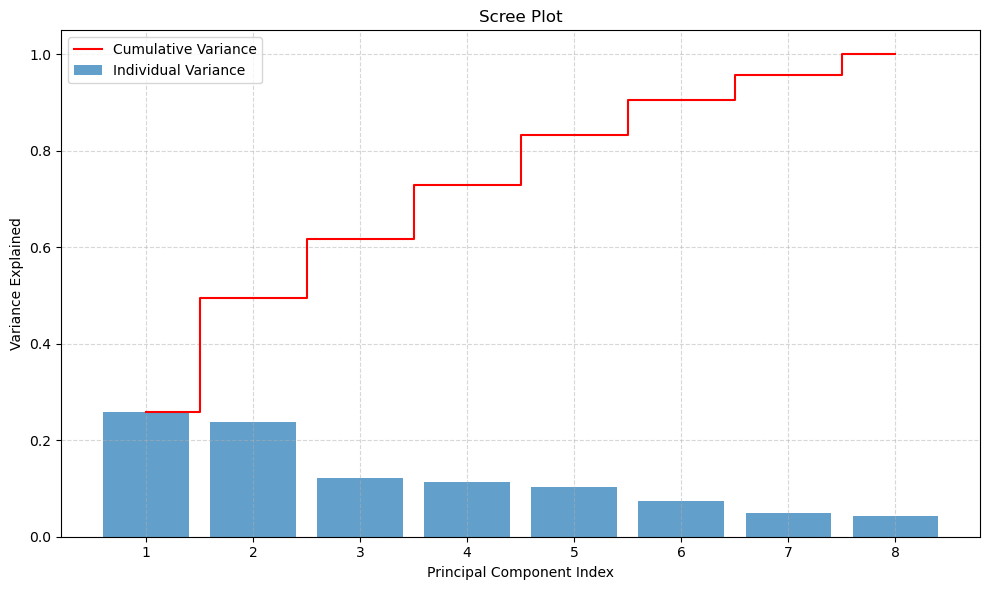

In [407]:
#Scree Plot
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA

# Assuming X_train is already preprocessed (scaled and imputed)
# Fit PCA on the preprocessed training data
pca = PCA()
X_train_pca = numerical_transformer.fit_transform(X_train)
pca.fit(X_train_pca)

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance_ratio)

# Create the scree plot
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.7, label='Individual Variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', color='red', label='Cumulative Variance')

plt.title('Scree Plot')
plt.xlabel('Principal Component Index')
plt.ylabel('Variance Explained')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.legend(loc='best')
plt.grid(visible=True, linestyle='--', alpha=0.5)
plt.tight_layout()

# Save the plot as an image
#plt.savefig("scree_plot.png", dpi=300)

# Show the plot (useful in Jupyter)
plt.show()


In [ ]:
#From the image, it seems like the first two or three components explain most of the variance in your data. This could guide us decision on
#how many components to retain for classification tasks

In [329]:
#The reduction in F1 score after applying PCA could be due to the loss of important feature relationships, as PCA transforms the data into 
#components that may not align well with the model's decision boundaries. Additionally, reducing the feature space could result in 
#insufficient information for the models to make accurate predictions. Finally, models like Random Forest can sensitive to
#dimensionality reduction, leading to degraded performance.

In [ ]:
#Experiment6
#Custom Experiment: Evaluate the Impact of Feature Engineering Using Polynomial Features and Interaction Terms
#Objective: The goal of this experiment is to evaluate how creating polynomial features (such as interactions or higher-degree features) 
#impacts the model’s performance, using classifiers like Logistic Regression and Random Forest.
#Steps1:
#Feature Engineering:Polynomial Features: Create new features by adding polynomial features (squared, cubic terms) of numerical columns,
#especially those you suspect might have non-linear relationships with the target.
#Interaction Terms: Create new features by multiplying pairs of features to capture interaction effects.
#Steps2:
#Create and Compare Models:
#Create a pipeline that includes the classifier and feature engineering (polynomial features + interaction terms).
#Train multiple models, such as Logistic Regression and Random Forest, on the original and transformed data.
#step3:
#Analyze Results:
#Compare the F1-scores of the models with and without polynomial features.
#Check if the polynomial features improve model performance or cause overfitting.
#Evaluate whether interaction terms provide additional predictive power.

In [335]:
import mlflow
import mlflow.sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline

# Assuming train_set and test_set are already defined in your environment, and you have split them into X and y
X_train = train_set.drop('Diabetes_Outcome', axis=1)
y_train = train_set['Diabetes_Outcome']
X_test = test_set.drop('Diabetes_Outcome', axis=1)
y_test = test_set['Diabetes_Outcome']

# Experiment #6: Compare Polynomial Features with a Linear Model
def experiment_with_polynomial_features_and_linear(X_train, X_test, y_train, y_test):
    # Start MLFlow experiment
    with mlflow.start_run():
        # Apply Polynomial Features (degree 2)
        poly = PolynomialFeatures(degree=2)
        X_train_poly = poly.fit_transform(X_train)
        X_test_poly = poly.transform(X_test)

        # Log Polynomial Feature Transformation
        mlflow.log_param("polynomial_degree", 2)

        # Model 1: Logistic Regression with Polynomial Features
        pipeline_poly = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(max_iter=1000))
        ])
        pipeline_poly.fit(X_train_poly, y_train)
        y_pred_poly = pipeline_poly.predict(X_test_poly)

        # Evaluate the polynomial model
        f1_poly = f1_score(y_test, y_pred_poly)
        cm_poly = confusion_matrix(y_test, y_pred_poly)

        # Log polynomial results
        mlflow.log_metric("f1_score_poly", f1_poly)
        mlflow.log_metric("TP_poly", cm_poly[1, 1])
        mlflow.log_metric("TN_poly", cm_poly[0, 0])
        mlflow.log_metric("FP_poly", cm_poly[0, 1])
        mlflow.log_metric("FN_poly", cm_poly[1, 0])

        # Log the polynomial model
        mlflow.sklearn.log_model(pipeline_poly, "model_with_polynomial_features")

        print(f"Polynomial model F1 Score: {f1_poly}")

        # Model 2: Logistic Regression without Polynomial Features (Linear Model)
        pipeline_linear = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(max_iter=1000))
        ])
        pipeline_linear.fit(X_train, y_train)
        y_pred_linear = pipeline_linear.predict(X_test)

        # Evaluate the linear model
        f1_linear = f1_score(y_test, y_pred_linear)
        cm_linear = confusion_matrix(y_test, y_pred_linear)

        # Log linear model results
        mlflow.log_metric("f1_score_linear", f1_linear)
        mlflow.log_metric("TP_linear", cm_linear[1, 1])
        mlflow.log_metric("TN_linear", cm_linear[0, 0])
        mlflow.log_metric("FP_linear", cm_linear[0, 1])
        mlflow.log_metric("FN_linear", cm_linear[1, 0])

        # Log the linear model
        mlflow.sklearn.log_model(pipeline_linear, "model_with_linear_features")

        print(f"Linear model F1 Score: {f1_linear}")

# Execute the comparison experiment
experiment_with_polynomial_features_and_linear(X_train, X_test, y_train, y_test)


2024/12/20 02:29:36 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Polynomial model F1 Score: 0.5825242718446602


2024/12/20 02:29:44 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


Linear model F1 Score: 0.56
🏃 View run resilient-swan-751 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/914b3c5dcf334fb0adb1853ef5072699
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0


In [337]:
#The polynomial model (degree 2) slightly outperforms the linear model, achieving an F1 score of 0.5825 compared to 0.56 for the linear model,
#indicating that polynomial features help capture non-linear relationships in the data. This suggests that more complex relationships exist
#between the features and the target variable. 

In [339]:
#For Experiment #7, Custom Experiment Idea: Feature Selection with Recursive Feature Elimination (RFE)
#We can use Recursive Feature Elimination (RFE) to select the most important features and observe how this affects the model's F1 score.
#Use RFE to select the top features based on their importance.
#Compare the performance of a model trained with the selected features vs. all features.
   

In [343]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import mlflow
import mlflow.sklearn

# Assuming train_set and test_set are already defined
X_train = train_set.drop('Diabetes_Outcome', axis=1)
y_train = train_set['Diabetes_Outcome']
X_test = test_set.drop('Diabetes_Outcome', axis=1)
y_test = test_set['Diabetes_Outcome']

# Experiment: Feature Selection using Recursive Feature Elimination (RFE)
def experiment_with_feature_selection(X_train, X_test, y_train, y_test):
    with mlflow.start_run():
        # Model to be used for RFE and final evaluation
        model = LogisticRegression(max_iter=1000, class_weight='balanced')

        # Apply RFE (Selecting top 5 features)
        rfe = RFE(estimator=model, n_features_to_select=5)
        X_train_rfe = rfe.fit_transform(X_train, y_train)
        X_test_rfe = rfe.transform(X_test)

        # Log the number of selected features
        mlflow.log_param("selected_features_count", 5)

        # Create a pipeline with StandardScaler and LogisticRegression
        pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(max_iter=1000))
        ])

        # Train the model with RFE-selected features
        pipeline.fit(X_train_rfe, y_train)

        # Predict on the test set
        y_pred = pipeline.predict(X_test_rfe)

        # Evaluate the model
        f1 = f1_score(y_test, y_pred)
        cm = confusion_matrix(y_test, y_pred)

        # Log metrics
        mlflow.log_metric("f1_score", f1)
        mlflow.log_metric("TP", cm[1, 1])  # True Positive
        mlflow.log_metric("TN", cm[0, 0])  # True Negative
        mlflow.log_metric("FP", cm[0, 1])  # False Positive
        mlflow.log_metric("FN", cm[1, 0])  # False Negative

        # Log the model
        mlflow.sklearn.log_model(pipeline, "model_with_RFE_feature_selection")

        # Also train a baseline model with all features to compare
        model_all_features = LogisticRegression(max_iter=1000, class_weight='balanced')
        model_all_features.fit(X_train, y_train)
        y_pred_all_features = model_all_features.predict(X_test)

        # Evaluate baseline model
        f1_all_features = f1_score(y_test, y_pred_all_features)
        mlflow.log_metric("baseline_f1_score", f1_all_features)

        print(f"F1 Score with RFE-selected features: {f1}")
        print(f"F1 Score with all features (baseline): {f1_all_features}")

# Call the function to execute the experiment
experiment_with_feature_selection(X_train, X_test, y_train, y_test)


2024/12/20 02:39:15 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


F1 Score with RFE-selected features: 0.5742574257425742
F1 Score with all features (baseline): 0.6721311475409836
🏃 View run hilarious-whale-109 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/ca111b93555f446a81118a1d74b0f557
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0


In [345]:
#RFE-based feature selection resulted in a decrease in the F1 score, indicating that reducing the number of features did not improve the model's performance.
#The baseline model with all features outperformed the RFE model, suggesting that the full set of features contains important information that helps the model's prediction.
#This experiment highlights that, in some cases, feature selection might not lead to improved performance and can potentially reduce the model's effectiveness.

Processing Experiment: Default
Filtered Experiments with F1-Scores:
                                           Experiment       Score_Type  \
12              XGBClassifier_feature_selection_model         F1_Score   
8               XGBClassifier_feature_selection_model         F1_Score   
16      XGBClassifier_model_after_feature_engineering         F1_Score   
21                       RandomForestClassifier_model         F1_Score   
20                                XGBClassifier_model         F1_Score   
13     RandomForestClassifier_feature_selection_model         F1_Score   
9      RandomForestClassifier_feature_selection_model         F1_Score   
17  RandomForestClassifier_model_after_feature_eng...         F1_Score   
0                                  indecisive-asp-836         f1_score   
2   Logistic_Regression_model_with_RFE_feature_sel...         f1_score   
11  model_exp4 LogisticRegression_feature_selectio...         F1_Score   
15         LogisticRegression_feature_select

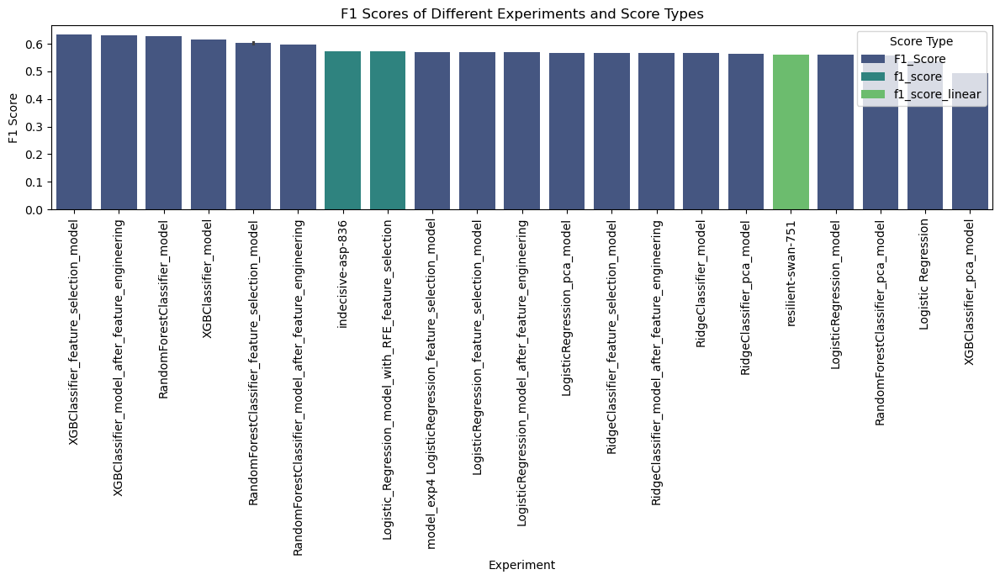

In [443]:
import mlflow
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Create a list to store experiment names and F1-scores
experiment_data = []

# Use mlflow.search_experiments() to get all experiments
experiments = mlflow.search_experiments()

# Iterate through the experiments and runs to retrieve F1-scores
for experiment in experiments:
    print(f"Processing Experiment: {experiment.name}")  # Debugging log
    runs = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

    for _, run in runs.iterrows():
        # Check for various F1-score metrics
        f1_scores = {
            'f1_score': run.get('metrics.f1_score'),
            'f1_score_linear': run.get('metrics.f1_score_linear'),
         #   'baseline_f1_score': run.get('metrics.baseline_f1_score'),
            'F1_Score': run.get('metrics.F1_Score')
        }

        # Filter valid F1-scores (non-NaN)
        for score_name, score_value in f1_scores.items():
            if pd.notna(score_value):
                experiment_name = run.get('tags.mlflow.runName', f"Experiment_{experiment.experiment_id}")
                experiment_data.append((experiment_name, score_name, score_value))

# Convert to a DataFrame for easier manipulation
df_experiments = pd.DataFrame(experiment_data, columns=['Experiment', 'Score_Type', 'F1_Score'])

# Sort the DataFrame by F1-Score for better visualization
df_experiments = df_experiments.sort_values(by='F1_Score', ascending=False)

# Display the filtered DataFrame
if not df_experiments.empty:
    print("Filtered Experiments with F1-Scores:")
    print(df_experiments)

    plt.figure(figsize=(12, 7))
    sns.barplot(data=df_experiments, x='Experiment', y='F1_Score', hue='Score_Type', palette='viridis')
    plt.xticks(rotation=90)
    plt.title('F1 Scores of Different Experiments and Score Types')
    plt.xlabel('Experiment')
    plt.ylabel('F1 Score')
    plt.legend(title='Score Type')
    plt.tight_layout()
    
    # Save the plot as an image
    print("Plot saved as 'f1_score_comparison.png'.")

    plt.show() #to avoid warnings
else:
    print("No valid F1-scores found in the experiments.")


In [ ]:
#From the graph we can see XGBClassifier_feature_selection_model has best second F1 Score has best F1 Score


In [431]:
pip install joblib


Note: you may need to restart the kernel to use updated packages.


In [455]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_selection import VarianceThreshold
from mlflow.models.signature import infer_signature
import joblib
from sklearn.preprocessing import FunctionTransformer

# Set up MLflow tracking
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Define feature engineering function
def feature_engineering(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=numerical_features + categorical_features)
    
    X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
    X['Log_Glucose'] = np.log(X['Glucose_Concentration'] + 1)  # Avoid log(0) by adding 1
    return X

# Correlation Threshold function
def correlation_threshold(X, threshold=0.9):
    corr_matrix = X.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
    X = X.drop(columns=to_drop)
    print(f"Features removed due to high correlation: {to_drop}")
    return X, to_drop

# Feature Importance function using RandomForest
def feature_importance(X_train, y_train, X_test):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    num_features = 10
    top_features = X_train.columns[indices[:num_features]]
    print(f"Top {num_features} important features: {top_features}")
    
    X_train = X_train[top_features]
    X_test = X_test[top_features]
    return X_train, X_test, top_features

# Variance Threshold function
def variance_threshold(X, threshold=0.01):
    original_columns = X.columns if isinstance(X, pd.DataFrame) else None
    selector = VarianceThreshold(threshold=threshold)
    X_selected = selector.fit_transform(X)
    
    if isinstance(X, pd.DataFrame):
        X_selected = pd.DataFrame(X_selected, columns=X.columns[selector.get_support()])
        removed_features = X.columns[~selector.get_support()]
        print(f"Features removed due to low variance: {removed_features}")
    
    return X_selected, removed_features

# Preprocessing setup for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, make_column_selector(dtype_include=['float64', 'int64'])),
        ('cat', categorical_transformer, make_column_selector(dtype_include=['object']))
    ]
)

# Log model function
def log_model_results(model, X_train, y_train, X_test, y_test, model_name, top_features, removed_features):
    with mlflow.start_run():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        mlflow.log_param("Model_Type", model_name)
        mlflow.log_param("Top_Features", ', '.join(top_features))
        mlflow.log_param("Removed_Features", ', '.join(removed_features))
        
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("True_Positive", tp)
        mlflow.log_metric("True_Negative", tn)
        mlflow.log_metric("False_Positive", fp)
        mlflow.log_metric("False_Negative", fn)
        
        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_feature_selection_model_exp4",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_feature_selection_model_exp4"
        )
        
        print(f"Model {model_name} logged with F1 Score: {f1}")

# Define models to be used
model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Load and split your data (replace with actual data)
# X_train, X_test, y_train, y_test = train_test_split(...)

X_train, removed_corr_features = correlation_threshold(X_train, threshold=0.9)
X_train, X_test, top_features = feature_importance(X_train, y_train, X_test)
X_train, removed_variance_features = variance_threshold(X_train, threshold=0.01)

removed_features = removed_corr_features + list(removed_variance_features)

# Create pipeline with feature engineering, preprocessing, and model
pipeline = Pipeline(steps=[
    ('feature_engineering', FunctionTransformer(feature_engineering, validate=False)),
    ('preprocessor', preprocessor),
    ('classifier', model)
])

# Train the final model and log it
log_model_results(pipeline, X_train, y_train, X_test, y_test, "XGBClassifier", top_features, removed_features)

# Save the model using joblib
joblib.dump(pipeline, 'final_xgb_classifier_model.joblib')
print("Model saved using joblib")


Features removed due to high correlation: ['Log_Glucose']
Top 10 important features: Index(['Glucose_Concentration', 'BMI_Age_Interaction',
       'Diabetes_Pedigree_Function', 'Body_Mass_Index', 'Age_In_Years',
       'Blood_Pressure', 'Number_of_Pregnancies', 'Skin_Thickness',
       'Insulin_Level'],
      dtype='object')
Features removed due to low variance: Index([], dtype='object')


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [13:05:31] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Registered model 'XGBClassifier_feature_selection_model_exp4' already exists. Creating a new version of this model...
2024/12/20 13:05:41 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBClassifier_feature_selection_model_exp4, version 3
Created version '3' of model 'XGBClassifier_feature_selection_model_exp4'.


Model XGBClassifier logged with F1 Score: 0.6346153846153846
🏃 View run vaunted-kit-665 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/2e711ff5b98e4c2eb35cf3a126e9076a
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Model saved using joblib


In [459]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
import joblib

pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('model', XGBClassifier())
])

# Save the entire pipeline
joblib.dump(pipeline, 'pipeline.joblib')


['pipeline.joblib']

In [453]:
import os
print(os.getcwd())


/Users/skgokulkumar


In [461]:
import os
import mlflow
import mlflow.sklearn
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_selection import VarianceThreshold
from mlflow.models.signature import infer_signature
import joblib
from sklearn.preprocessing import FunctionTransformer

# Set up MLflow tracking
MLFLOW_TRACKING_URI = "https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'gopikaskumar18'
os.environ['MLFLOW_TRACKING_PASSWORD'] = 'ea57e4a82024e6ac634c7fae1644433a1ce5a182'
mlflow.set_tracking_uri(MLFLOW_TRACKING_URI)

# Define feature engineering function
def feature_engineering(X):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=numerical_features + categorical_features)
    
    X['BMI_Age_Interaction'] = X['Body_Mass_Index'] * X['Age_In_Years']
    X['Log_Glucose'] = np.log(X['Glucose_Concentration'] + 1)  # Avoid log(0) by adding 1
    return X

# Correlation Threshold function
def correlation_threshold(X, threshold=0.9):
    corr_matrix = X.corr().abs()
    upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > threshold)]
    X = X.drop(columns=to_drop)
    print(f"Features removed due to high correlation: {to_drop}")
    return X, to_drop

# Feature Importance function using RandomForest
def feature_importance(X_train, y_train, X_test):
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X_train, y_train)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    
    num_features = 10
    top_features = X_train.columns[indices[:num_features]]
    print(f"Top {num_features} important features: {top_features}")
    
    X_train = X_train[top_features]
    X_test = X_test[top_features]
    return X_train, X_test, top_features

# Variance Threshold function
def variance_threshold(X, threshold=0.01):
    original_columns = X.columns if isinstance(X, pd.DataFrame) else None
    selector = VarianceThreshold(threshold=threshold)
    X_selected = selector.fit_transform(X)
    
    if isinstance(X, pd.DataFrame):
        X_selected = pd.DataFrame(X_selected, columns=X.columns[selector.get_support()])
        removed_features = X.columns[~selector.get_support()]
        print(f"Features removed due to low variance: {removed_features}")
    
    return X_selected, removed_features

# Preprocessing setup for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, make_column_selector(dtype_include=['float64', 'int64'])),
        ('cat', categorical_transformer, make_column_selector(dtype_include=['object']))
    ]
)

# Log model function
def log_model_results(model, X_train, y_train, X_test, y_test, model_name, top_features, removed_features):
    with mlflow.start_run():
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        f1 = f1_score(y_test, y_pred)
        tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()
        
        mlflow.log_param("Model_Type", model_name)
        mlflow.log_param("Top_Features", ', '.join(top_features))
        mlflow.log_param("Removed_Features", ', '.join(removed_features))
        
        mlflow.log_metric("F1_Score", f1)
        mlflow.log_metric("True_Positive", tp)
        mlflow.log_metric("True_Negative", tn)
        mlflow.log_metric("False_Positive", fp)
        mlflow.log_metric("False_Negative", fn)
        
        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path=f"{model_name}_feature_selection_model_exp4",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{model_name}_feature_selection_model_exp4"
        )
        
        print(f"Model {model_name} logged with F1 Score: {f1}")

# Define models to be used
model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')

# Load and split your data (replace with actual data)
# X_train, X_test, y_train, y_test = train_test_split(...)

X_train, removed_corr_features = correlation_threshold(X_train, threshold=0.9)
X_train, X_test, top_features = feature_importance(X_train, y_train, X_test)
X_train, removed_variance_features = variance_threshold(X_train, threshold=0.01)

removed_features = removed_corr_features + list(removed_variance_features)

# Create pipeline with feature engineering, preprocessing, and model
pipeline = Pipeline(steps=[
    ('feature_engineering', FunctionTransformer(feature_engineering, validate=False)),
    ('preprocessor', preprocessor),
    ('classifier', model)
])

# Train the final model and log it
log_model_results(pipeline, X_train, y_train, X_test, y_test, "XGBClassifier", top_features, removed_features)

# Save the model using joblib
joblib.dump(pipeline, 'final_xgb_classifier_model_with_feature_engineering.joblib')
print("Model saved using joblib")


Features removed due to high correlation: ['Log_Glucose']
Top 10 important features: Index(['Glucose_Concentration', 'BMI_Age_Interaction',
       'Diabetes_Pedigree_Function', 'Body_Mass_Index', 'Age_In_Years',
       'Number_of_Pregnancies', 'Skin_Thickness', 'Blood_Pressure',
       'Insulin_Level'],
      dtype='object')
Features removed due to low variance: Index([], dtype='object')


/opt/anaconda3/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [14:39:31] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
Registered model 'XGBClassifier_feature_selection_model_exp4' already exists. Creating a new version of this model...
2024/12/20 14:39:41 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBClassifier_feature_selection_model_exp4, version 4
Created version '4' of model 'XGBClassifier_feature_selection_model_exp4'.


Model XGBClassifier logged with F1 Score: 0.6346153846153846
🏃 View run serious-frog-59 at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0/runs/eeca5d6a05f7447d92e81487670453d4
🧪 View experiment at: https://dagshub.com/gopikaskumar18/Fall_2024_Diabetes_Model.mlflow/#/experiments/0
Model saved using joblib


In [463]:
loaded_model = joblib.load('final_xgb_classifier_model_with_feature_engineering.joblib')
print(loaded_model)


Pipeline(steps=[('feature_engineering',
                 FunctionTransformer(func=<function feature_engineering at 0x1bb565080>)),
                ('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer()),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x1bb573aa0>),
                                                 ('cat',
                                                  Pipeline(steps=[('imputer'...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_cons